In [1]:
import pandas as pd
import seaborn as sns

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from matplotlib import pyplot as plt


Будем учиться классифицировать жанры музыки, полузуюсь не аудио дорожками, а уже осмысленными признаками (правда, не все из них имеют понятные названия). Сами данные можно найти [здесь](https://www.kaggle.com/purumalgi/music-genre-classification). Будем использовать файл `train.csv`. Нашей задачей будет предсказание переменной `Class` (жанр песни) при помощи деревьев решений. Можно попробовать также другие методы классификации, которые мы прошли, и сравнить результаты. При обучении всех моделей не забывайте про разделение на тренировку и тест (или кросс валидацию [ссылка](https://www.youtube.com/watch?v=fSytzGwwBVw)).

### Задание 1. EDA (10 баллов)

Как обычно, начнем с того, что посмотрим на наши данные: типы переменных, пропущенные значения, баланс классов и все такое. Ваш ход:

In [2]:
data = pd.read_csv("train.csv")
data.head()

,Artist Name,Track Name,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
0,Bruno Mars,That's What I Like (feat. Gucci Mane),60.0,0.854,0.564,1.0,-4.964,1,0.0485,0.017100,NaN,0.0849,0.8990,134.071,234596.0,4,5
1,Boston,Hitch a Ride,54.0,0.382,0.814,3.0,-7.230,1,0.0406,0.001100,0.004010,0.1010,0.5690,116.454,251733.0,4,10
2,The Raincoats,No Side to Fall In,35.0,0.434,0.614,6.0,-8.334,1,0.0525,0.486000,0.000196,0.3940,0.7870,147.681,109667.0,4,6
3,Deno,Lingo (feat. J.I & Chunkz),66.0,0.853,0.597,10.0,-6.528,0,0.0555,0.021200,NaN,0.1220,0.5690,107.033,173968.0,4,5
4,Red Hot Chili Peppers,Nobody Weird Like Me - Remastered,53.0,0.167,0.975,2.0,-4.279,1,0.2160,0.000169,0.016100,0.1720,0.0918,199.060,229960.0,4,10


In [18]:
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:,2:-1], data.iloc[:,-1], random_state=42, test_size=0.2)

In [21]:
train = pd.concat((X_train, y_train), axis=1)
# EDA
print(train.shape)
train.describe()

(14396, 15)


,Popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_in min/ms,time_signature,Class
count,14058.000000,14396.000000,14396.000000,12788.000000,14396.000000,14396.000000,14396.000000,14396.000000,10960.000000,14396.000000,14396.000000,14396.000000,1.439600e+04,14396.000000,14396.000000
mean,44.657988,0.543513,0.663060,5.948155,-7.930852,0.637052,0.080275,0.246237,0.177131,0.196063,0.486498,122.606745,2.003162e+05,3.924701,6.707836
std,17.499543,0.166221,0.235115,3.202586,4.070670,0.480867,0.084958,0.309697,0.303864,0.159638,0.240441,29.663698,1.112347e+05,0.361424,3.192875
min,1.000000,0.059900,0.000020,1.000000,-36.214000,0.000000,0.022500,0.000000,0.000001,0.011900,0.018300,30.557000,5.016500e-01,1.000000,0.000000
25%,33.000000,0.432000,0.511000,3.000000,-9.539250,0.000000,0.034800,0.004428,0.000088,0.097000,0.297000,99.370000,1.659455e+05,4.000000,5.000000
50%,44.000000,0.546000,0.700000,6.000000,-7.040500,1.000000,0.047300,0.081400,0.003885,0.129000,0.482000,120.041500,2.089735e+05,4.000000,8.000000
75%,57.000000,0.659000,0.861000,9.000000,-5.197000,1.000000,0.083200,0.431000,0.198000,0.258000,0.672000,142.022250,2.525308e+05,4.000000,10.000000
max,100.000000,0.989000,1.000000,11.000000,1.355000,1.000000,0.955000,0.996000,0.996000,1.000000,0.986000,217.416000,1.477187e+06,5.000000,10.000000


In [22]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14396 entries, 15758 to 15795
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Popularity          14058 non-null  float64
 1   danceability        14396 non-null  float64
 2   energy              14396 non-null  float64
 3   key                 12788 non-null  float64
 4   loudness            14396 non-null  float64
 5   mode                14396 non-null  int64  
 6   speechiness         14396 non-null  float64
 7   acousticness        14396 non-null  float64
 8   instrumentalness    10960 non-null  float64
 9   liveness            14396 non-null  float64
 10  valence             14396 non-null  float64
 11  tempo               14396 non-null  float64
 12  duration_in min/ms  14396 non-null  float64
 13  time_signature      14396 non-null  int64  
 14  Class               14396 non-null  int64  
dtypes: float64(12), int64(3)
memory usage: 1.8 MB


<Axes: xlabel='Class', ylabel='Count'>

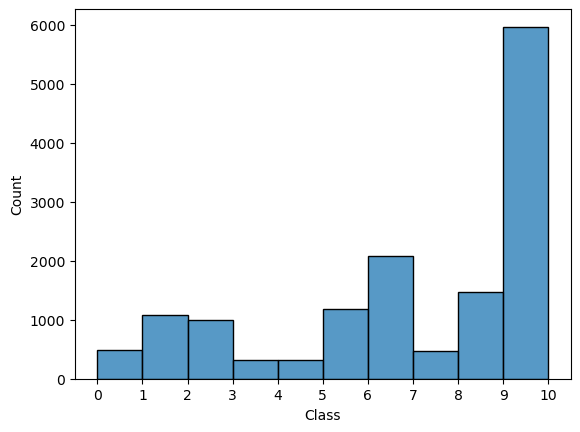

In [17]:
hist = sns.histplot(train['Class'], bins=10)
hist.set_xticks(range(11))
hist

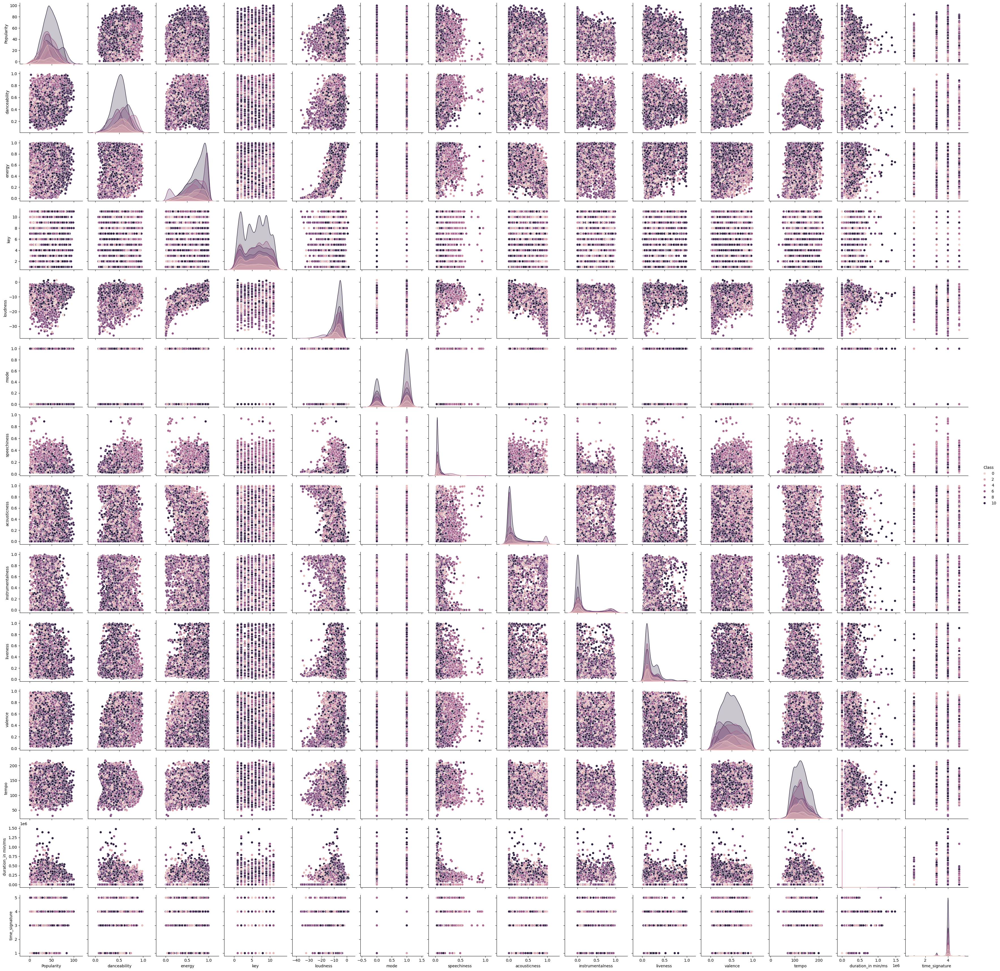

In [11]:
sns.pairplot(train, hue='Class')

<Axes: >

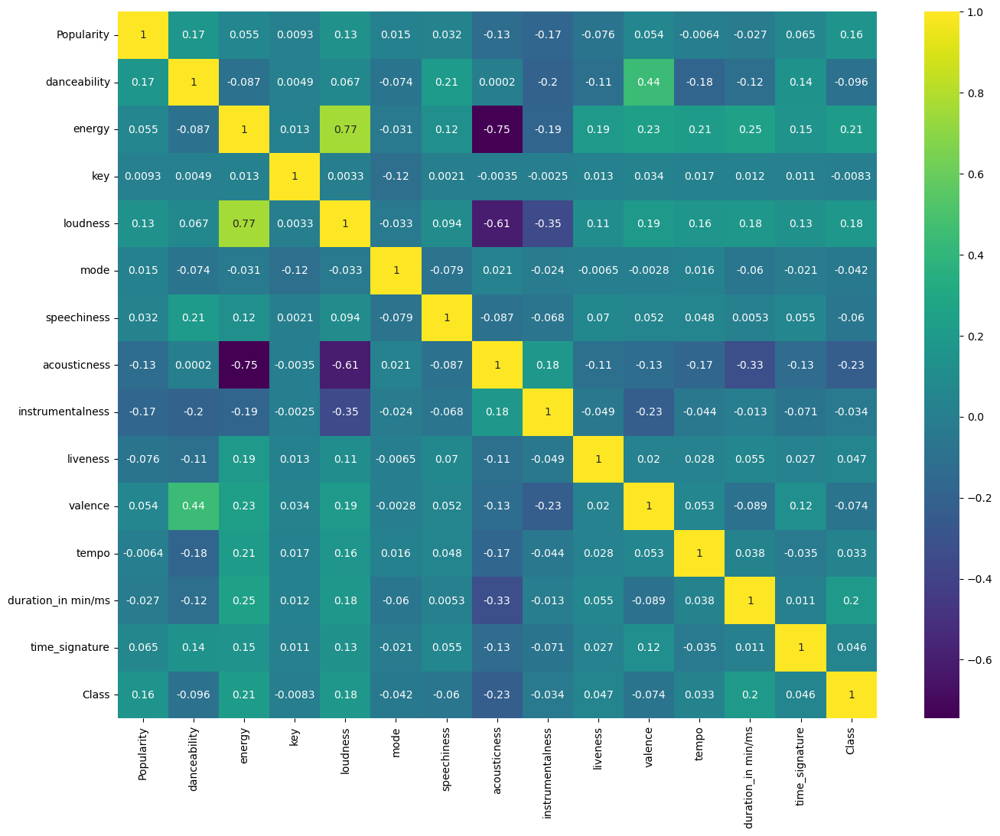

In [13]:
corr_matrix = train.iloc[:,2:].corr()
fig, ax = plt.subplots(figsize=(16,12))

sns.heatmap(corr_matrix, annot=True, cmap='viridis',ax=ax)

### Задание 2. Обучение дерева решений (10 баллов)

Предобработайте признаки так, чтобы их можно было подать в модель дерева решений и обучите ее, постарайтесь подобрать оптимальные гиперпараметры, которые вам известны. Постарайтесь также обосновать выбор метрики в данном случае. При подборе гиперпараметров может помочь `GridSearchCV` [ссылка](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).

In [36]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

def dtree_grid_search(X,y,nfolds=5):
    #create a dictionary of all values we want to test
    params = {
    'clf__max_depth': [5,20,100,150,200,250,300,400,500,1000],
    'clf__min_samples_leaf': [2,5,10,12,15]
    }

    # decision tree model
    clf_pipe = Pipeline([
    ('scaler', StandardScaler()),     
    ('clf', DecisionTreeClassifier()) 
    ])                                    

    #use gridsearch to test all values
    dtree_gscv = GridSearchCV(clf_pipe, params, cv=nfolds, n_jobs=-1, scoring='f1_macro')
    #fit model to data
    dtree_gscv.fit(X, y)
    print(f'training: {classification_report(y, dtree_gscv.predict(X))}')
    print(f'test: {classification_report(y_test, dtree_gscv.predict(X_test))}')
    return dtree_gscv.best_params_

best_model = dtree_grid_search(X_train, y_train)

training:               precision    recall  f1-score   support

           0       0.43      0.88      0.57       489
           1       0.39      0.13      0.19      1087
           2       0.52      0.44      0.47       991
           3       0.63      0.10      0.17       324
           4       0.63      0.52      0.57       316
           5       0.69      0.74      0.71      1185
           6       0.52      0.48      0.50      2087
           7       0.97      0.81      0.88       473
           8       0.67      0.57      0.62      1472
           9       0.59      0.55      0.57      1993
          10       0.55      0.72      0.63      3979

    accuracy                           0.57     14396
   macro avg       0.60      0.54      0.54     14396
weighted avg       0.58      0.57      0.56     14396

test:               precision    recall  f1-score   support

           0       0.45      0.79      0.58       136
           1       0.17      0.06      0.09       286
        

### Задание 3. Другие модели (без баллов, просто если есть желание)

Проделайте операции из **Задания 2** с другими известными вам классификаторами. Стало ли лучше?

### Задание 4. (0.5 доп. балла)

Расскажите про свои любимые фильмы, мультики и тд.

1. Интерстеллар
2. Жизнь других
3. Список Шиндлера